In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/birdclef-2023/sample_submission.csv
/kaggle/input/birdclef-2023/eBird_Taxonomy_v2021.csv
/kaggle/input/birdclef-2023/train_metadata.csv
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC247367.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC574558.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC403259.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC498854.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC289493.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC716763.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC498853.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC338717.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC349660.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC403543.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC574557.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC346069.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC530126.ogg
/kaggle/input/birdclef-2023/train_audio/yetgre1/XC530241.

### Import required libraries

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_io as tfio

import pandas as pd
import numpy as np
import librosa
import glob

import csv
import io

from IPython.display import Audio

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
# Load a sample audio files from two different species
audio_abe, sr_abe = librosa.load("/kaggle/input/birdclef-2023/train_audio/abethr1/XC128013.ogg")
audio_abh, sr_abh = librosa.load("/kaggle/input/birdclef-2023/train_audio/abhori1/XC127317.ogg")
audio_sun, sr_sun = librosa.load("/kaggle/input/birdclef-2023/train_audio/edcsun3/XC470591.ogg")

In [4]:
# Play the audio
Audio(data=audio_abe, rate=sr_abe)

In [5]:
# Play the audio
Audio(data=audio_sun, rate=sr_sun)

In [6]:
# Play the audio
Audio(data=audio_abh, rate=sr_abh)

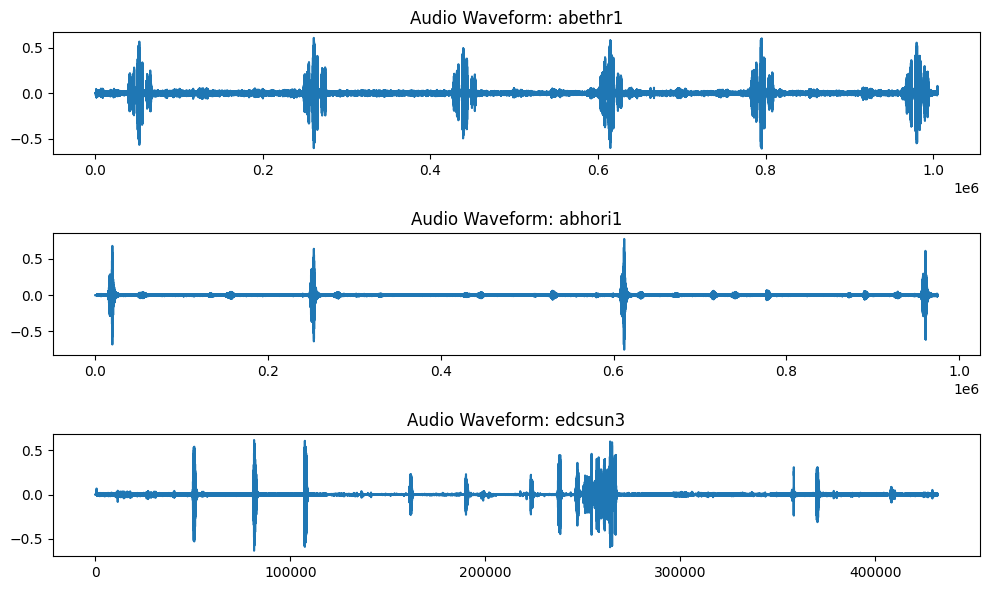

In [7]:
import matplotlib.pyplot as plt

# Plot the waveforms
plt.figure(figsize=(10, 6))

# Audio 1: abethr1
plt.subplot(3, 1, 1)
plt.title('Audio Waveform: abethr1')
plt.plot(audio_abe)

# Audio 2: abhori1
plt.subplot(3, 1, 2)
plt.title('Audio Waveform: abhori1')
plt.plot(audio_abh)

# Audio 3: edcsun3
plt.subplot(3, 1, 3)
plt.title('Audio Waveform: edcsun3')
plt.plot(audio_sun)

plt.tight_layout()
plt.show()


In [8]:
import librosa.feature as lf

# Extract MFCC features
mfcc_abe = lf.mfcc(y=audio_abe, sr=sr_abe)
mfcc_abh = lf.mfcc(y=audio_abh, sr=sr_abh)
mfcc_sun = lf.mfcc(y=audio_sun, sr=sr_sun)




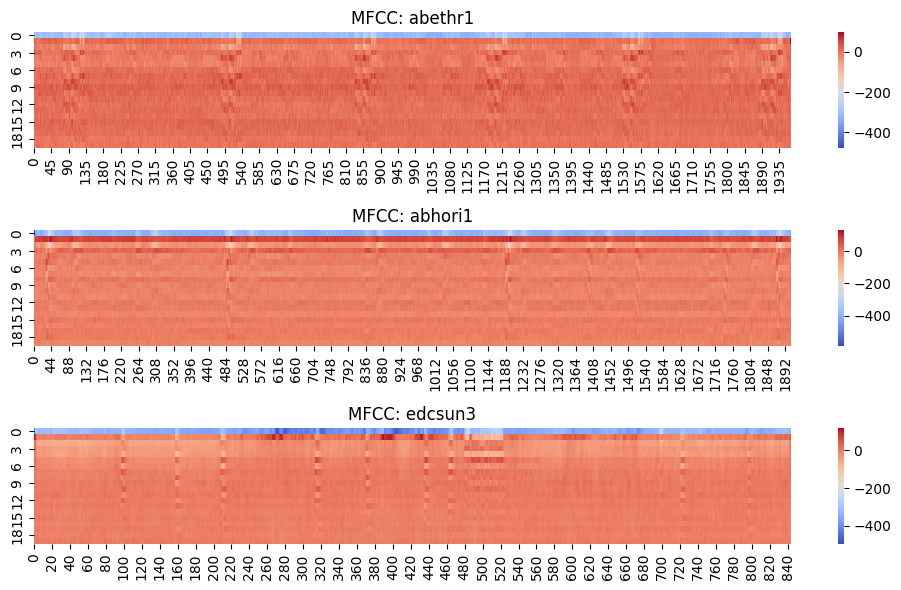

In [9]:
import seaborn as sns

# Plot MFCC features
plt.figure(figsize=(10, 6))

plt.subplot(3, 1, 1)
plt.title('MFCC: abethr1')
sns.heatmap(mfcc_abe, cmap='coolwarm')

plt.subplot(3, 1, 2)
plt.title('MFCC: abhori1')
sns.heatmap(mfcc_abh, cmap='coolwarm')

plt.subplot(3, 1, 3)
plt.title('MFCC: edcsun3')
sns.heatmap(mfcc_sun, cmap='coolwarm')

plt.tight_layout()
plt.show()


In [10]:
# Load the model.
model = hub.load('https://kaggle.com/models/google/bird-vocalization-classifier/frameworks/tensorFlow2/variations/bird-vocalization-classifier/versions/1')
# model = hub.load('https://tfhub.dev/google/yamnet/1')
labels_path = hub.resolve('https://kaggle.com/models/google/bird-vocalization-classifier/frameworks/tensorFlow2/variations/bird-vocalization-classifier/versions/1') + "/assets/label.csv"

In [11]:
# Define a function to extract class names from the provided CSV file.
def class_names_from_csv(class_map_csv_text):
    """Returns list of class names corresponding to score vector."""
    with open(labels_path) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=',')
        # Extract the class names from the CSV file.
        class_names = [mid for mid, desc in csv_reader]
        # Return the class names starting from index 1 (i.e. skipping the first row which contains the header).
        return class_names[1:]

# Call the function to extract class names from the provided CSV file.
## Note that the bird classifier classifies a much larger set of birds than the
## competition, so we need to load the model's set of class names or else our 
## indices will be off.
classes = class_names_from_csv(labels_path)


In [12]:
train_metadata = pd.read_csv("/kaggle/input/birdclef-2023/train_metadata.csv")
train_metadata.head()

# get the unique primary labels from train_metadata
competition_classes = sorted(train_metadata.primary_label.unique())

# map the competition classes to the pretrained model's class indices
# use a default index of 0 for classes not supported by the pretrained model
competition_class_map = [classes.index(c) if c in classes else 0 for c in competition_classes]

# count the number of classes not supported by the pretrained model
num_unsupported_classes = competition_class_map.count(0)
num_unsupported_classes

3

In [13]:
def frame_audio(audio_array: np.ndarray,
                window_size_s: float = 5.0,
                hop_size_s: float = 5.0,
                sample_rate=32000) -> np.ndarray:
    """Framing audio for inference.

    Args:
        audio_array (np.ndarray): The audio signal.
        window_size_s (float, optional): The window size in seconds. Defaults to 5.0.
        hop_size_s (float, optional): The hop size in seconds. Defaults to 5.0.
        sample_rate (int, optional): The sample rate of the audio. Defaults to 32000.

    Returns:
        np.ndarray: The framed audio signal.
    """
    if window_size_s is None or window_size_s < 0:
        return audio_array[np.newaxis, :]

    frame_length = int(window_size_s * sample_rate)
    hop_length = int(hop_size_s * sample_rate)

    # Frame the audio using TensorFlow Signal.
    framed_audio = tf.signal.frame(audio_array, frame_length, hop_length, pad_end=True)
    return framed_audio


def ensure_sample_rate(waveform, original_sample_rate, desired_sample_rate=32000):
    """Resample the waveform if required.

    Args:
        waveform (tf.Tensor): The audio signal.
        original_sample_rate (int): The original sample rate of the audio.
        desired_sample_rate (int, optional): The desired sample rate. Defaults to 32000.

    Returns:
        Tuple[int, tf.Tensor]: A tuple containing the new sample rate and the resampled waveform.
    """
    if original_sample_rate != desired_sample_rate:
        waveform = tfio.audio.resample(waveform, original_sample_rate, desired_sample_rate)
    return desired_sample_rate, waveform


In [14]:
audio, sample_rate = librosa.load("/kaggle/input/birdclef-2023/train_audio/blcapa2/XC120989.ogg")
sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)
Audio(wav_data, rate=sample_rate)

In [15]:
# frame the audio using a window size of 5 seconds and hop size of 5 seconds
fixed_tm = frame_audio(wav_data, window_size_s=5.0, hop_size_s=5.0)

# pass the framed audio to the model's infer_tf function to get the logits and embeddings
logits, embeddings = model.infer_tf(fixed_tm[:1])

# apply softmax to get probabilities and find the index of the highest probability
probabilities = tf.nn.softmax(logits)
argmax = np.argmax(probabilities)

# print the predicted class name and its corresponding probability
print(f"The audio is from the class {classes[argmax]} (element:{argmax} in the label.csv file), with probability of {probabilities[0][argmax]}")


The audio is from the class blcapa2 (element:1150 in the label.csv file), with probability of 0.9393535852432251


In [16]:
def predict_for_sample(filename, sample_submission, frame_limit_secs=None):
    # Get the file ID from the filename
    file_id = filename.split(".ogg")[0].split("/")[-1]
    
    # Load the audio data and ensure the correct sample rate
    audio, sample_rate = librosa.load(filename)
    sample_rate, wav_data = ensure_sample_rate(audio, sample_rate)
    
    # Frame the audio data into fixed-size windows
    fixed_tm = frame_audio(wav_data)
    
    # Predict the class probabilities for each window
    frame = 5
    all_logits, all_embeddings = model.infer_tf(fixed_tm[:1])
    for window in fixed_tm[1:]:
        if frame_limit_secs and frame > frame_limit_secs:
            continue
        
        # Infer the logits and embeddings for the current window
        logits, embeddings = model.infer_tf(window[np.newaxis, :])
        
        # Append the logits to the array of all logits
        all_logits = np.concatenate([all_logits, logits], axis=0)
        
        # Increment the frame counter
        frame += 5
    
    # Convert the logits to probabilities and update the sample submission
    frame = 5
    all_probabilities = []
    for frame_logits in all_logits:
        probabilities = tf.nn.softmax(frame_logits).numpy()
        
        ## set the appropriate row in the sample submission
        sample_submission.loc[sample_submission.row_id == file_id + "_" + str(frame), competition_classes] = probabilities[competition_class_map]
        
        # Increment the frame counter
        frame += 5


In [17]:
test_samples = list(glob.glob("/kaggle/input/birdclef-2023/test_soundscapes/*.ogg"))
test_samples

['/kaggle/input/birdclef-2023/test_soundscapes/soundscape_29201.ogg']

In [18]:
sample_sub = pd.read_csv("/kaggle/input/birdclef-2023/sample_submission.csv")
sample_sub[competition_classes] = sample_sub[competition_classes].astype(np.float32)
sample_sub.head()

,row_id,abethr1,abhori1,abythr1,afbfly1,afdfly1,afecuc1,affeag1,afgfly1,afghor1,...,yebsto1,yeccan1,yefcan,yelbis1,yenspu1,yertin1,yesbar1,yespet1,yetgre1,yewgre1
0,soundscape_29201_5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,soundscape_29201_10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,soundscape_29201_15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [19]:
frame_limit_secs = 15 if sample_sub.shape[0] == 3 else None
for sample_filename in test_samples:
    predict_for_sample(sample_filename, sample_sub, frame_limit_secs=15)

In [20]:
sample_sub

,row_id,abethr1,abhori1,abythr1,afbfly1,afdfly1,afecuc1,affeag1,afgfly1,afghor1,...,yebsto1,yeccan1,yefcan,yelbis1,yenspu1,yertin1,yesbar1,yespet1,yetgre1,yewgre1
0,soundscape_29201_5,0.000003,0.000006,0.000065,0.000002,0.000002,0.000025,0.000001,5.693452e-07,0.000053,...,1.850780e-07,0.000003,0.000003,1.290769e-07,1.641936e-07,0.000001,0.000002,0.000001,5.424379e-07,0.000001
1,soundscape_29201_10,0.000011,0.000299,0.000012,0.000332,0.000013,0.000013,0.000032,1.564809e-06,0.000003,...,1.845715e-06,0.000069,0.000080,5.035393e-04,1.903965e-06,0.000032,0.000012,0.000142,4.474528e-06,0.000264
2,soundscape_29201_15,0.000220,0.000744,0.000434,0.000048,0.000005,0.000090,0.000002,2.212038e-05,0.000005,...,2.365196e-06,0.000027,0.000322,4.070630e-05,1.546081e-05,0.000019,0.000002,0.005072,3.049738e-05,0.000053


In [21]:
sample_sub.to_csv("submission.csv", index=False)

In [22]:
# /kaggle/input/bird-vocalization-classifier/tensorflow2/bird-vocalization-classifier/1/saved_model.pb
# /kaggle/input/bird-vocalization-classifier/tensorflow2/bird-vocalization-classifier/1/assets/genus.csv
# /kaggle/input/bird-vocalization-classifier/tensorflow2/bird-vocalization-classifier/1/assets/family.csv
# /kaggle/input/bird-vocalization-classifier/tensorflow2/bird-vocalization-classifier/1/assets/order.csv
# /kaggle/input/bird-vocalization-classifier/tensorflow2/bird-vocalization-classifier/1/assets/label.csv
# /kaggle/input/bird-vocalization-classifier/tensorflow2/bird-vocalization-classifier/1/variables/variables.index
# /kaggle/input/bird-vocalization-classifier/tensorflow2/bird-vocalization-classifier/1/variables/variables.data-00000-of-00001
# /kaggle/input/birdclef-2023/sample_submission.csv
# /kaggle/input/birdclef-2023/eBird_Taxonomy_v2021.csv
# /kaggle/input/birdclef-2023/train_metadata.csv

In [34]:


# Load the taxonomy data into a DataFrame
taxonomy_data = pd.read_csv("/kaggle/input/birdclef-2023/eBird_Taxonomy_v2021.csv")

# Drop unnecessary columns
# columns_to_drop = ['TAXON_ORDER', 'ORDER1', 'REPORT_AS']
# taxonomy_data = taxonomy_data.drop(columns=columns_to_drop)

# Drop rows with missing values
# taxonomy_data = taxonomy_data.dropna()

# Reset the index
taxonomy_data = taxonomy_data.reset_index(drop=True)

# Print the cleaned taxonomy data
print(taxonomy_data)

# Access specific columns
species_codes = taxonomy_data['SPECIES_CODE']
common_names = taxonomy_data['PRIMARY_COM_NAME']
scientific_names = taxonomy_data['SCI_NAME']

# Filter the taxonomy data based on category
species_only = taxonomy_data[taxonomy_data['CATEGORY'] == 'species']

# Filter the taxonomy data based on a specific bird species code
specific_species = taxonomy_data[taxonomy_data['SPECIES_CODE'] == 'grerhe1']

# Display the filtered taxonomy data
print(species_only.head())
# print(specific_species.head())


       TAXON_ORDER CATEGORY SPECIES_CODE         PRIMARY_COM_NAME  \
0                1  species      ostric2           Common Ostrich   
1                6  species      ostric3           Somali Ostrich   
2                7    slash       y00934    Common/Somali Ostrich   
3                8  species      grerhe1             Greater Rhea   
4               14  species      lesrhe2              Lesser Rhea   
...            ...      ...          ...                      ...   
16748        34694  species      slcgro1   Slate-colored Grosbeak   
16749        34697  species      bltgro2  Black-throated Grosbeak   
16750        34698     spuh      saltat1             saltator sp.   
16751        34699     spuh      passer1            passerine sp.   
16752        35000     spuh        bird1                 bird sp.   

                             SCI_NAME            ORDER1  \
0                    Struthio camelus  Struthioniformes   
1              Struthio molybdophanes  Struthioniform

In [35]:
taxonomy_data

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
2,7,slash,y00934,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
3,8,species,grerhe1,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,NaN
4,14,species,lesrhe2,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),NaN,NaN
...,...,...,...,...,...,...,...,...,...
16748,34694,species,slcgro1,Slate-colored Grosbeak,Saltator grossus,Passeriformes,Thraupidae (Tanagers and Allies),NaN,NaN
16749,34697,species,bltgro2,Black-throated Grosbeak,Saltator fuliginosus,Passeriformes,Thraupidae (Tanagers and Allies),NaN,NaN
16750,34698,spuh,saltat1,saltator sp.,Saltator sp.,Passeriformes,Thraupidae (Tanagers and Allies),NaN,NaN
16751,34699,spuh,passer1,passerine sp.,Passeriformes sp.,Passeriformes,NaN,Others,NaN


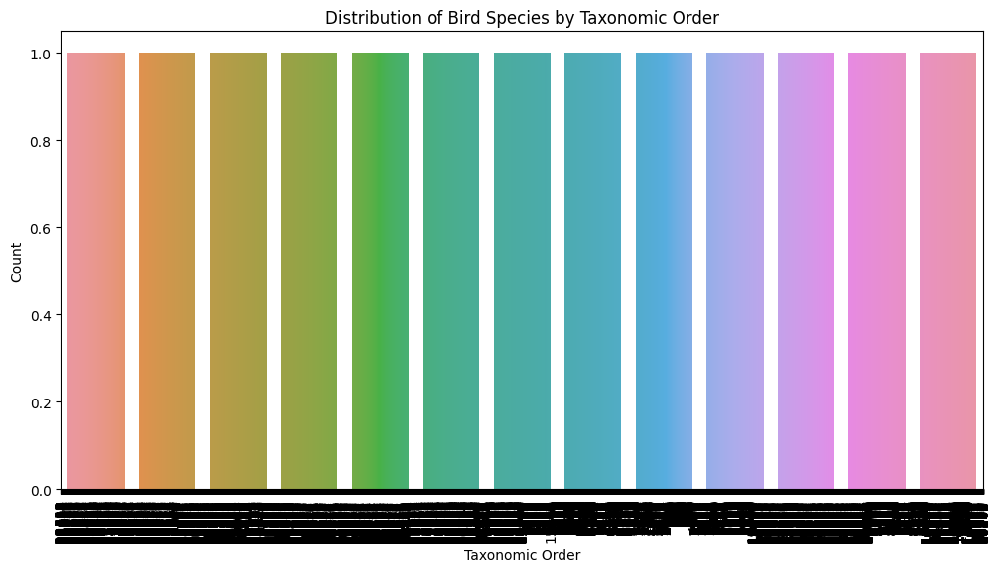

In [36]:
# Count Plot of Orders or Families
order_counts = taxonomy_data['TAXON_ORDER'].value_counts()
plt.figure(figsize=(12, 6))
sns.countplot(x='TAXON_ORDER', data=taxonomy_data, order=order_counts.index)
plt.title('Distribution of Bird Species by Taxonomic Order')
plt.xlabel('Taxonomic Order')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

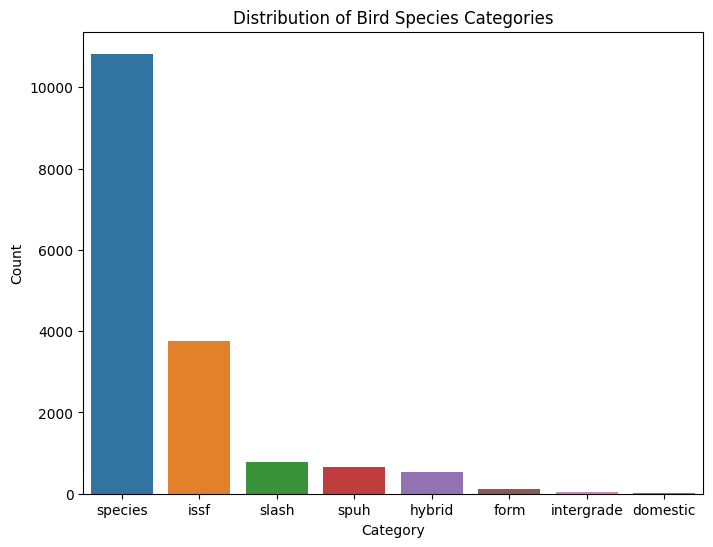

In [25]:

# Bar Plot of Categories
category_counts = taxonomy_data['CATEGORY'].value_counts()
plt.figure(figsize=(8, 6))
sns.barplot(x=category_counts.index, y=category_counts.values)
plt.title('Distribution of Bird Species Categories')
plt.xlabel('Category')
plt.ylabel('Count')
plt.show()













In [ ]:
from wordcloud import WordCloud
# Word Cloud of Common Names
common_names_text = ' '.join(taxonomy_data['PRIMARY_COM_NAME'].dropna().values)
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(common_names_text)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Bird Species Common Names')
plt.show()

In [ ]:

# Scatter Plot of Taxon Order vs. Species Count
order_species_counts = taxonomy_data.groupby('TAXON_ORDER')['SPECIES_CODE'].count().reset_index()
plt.figure(figsize=(12, 6))
plt.scatter(x='TAXON_ORDER', y='SPECIES_CODE', data=order_species_counts)
plt.title('Number of Bird Species per Taxonomic Order')
plt.xlabel('Taxonomic Order')
plt.ylabel('Species Count')
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Histogram of Species Group
plt.figure(figsize=(10, 6))
sns.histplot(data=taxonomy_data, x='SPECIES_GROUP')
plt.title('Distribution of Bird Species across Species Groups')
plt.xlabel('Species Group')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [ ]:
# Pie Chart of Category Proportions
category_proportions = taxonomy_data['CATEGORY'].value_counts(normalize=True)
plt.figure(figsize=(8, 8))
plt.pie(category_proportions, labels=category_proportions.index, autopct='%1.1f%%', startangle=90)
plt.title('Proportions of Bird Species Categories')
plt.axis('equal')
plt.show()

In [ ]:
# Heatmap of Taxonomic Relationships
taxonomy_matrix = taxonomy_data.pivot_table(index='FAMILY', columns='TAXON_ORDER', values='SPECIES_CODE', aggfunc='count')
plt.figure(figsize=(12, 6))
sns.heatmap(taxonomy_matrix, cmap='YlGnBu', cbar=True, annot=True, fmt='g')
plt.title('Taxonomic Relationships: Family vs. Taxon Order')
plt.xlabel('Taxon Order')
plt.ylabel('Family')
plt.xticks(rotation=90)
plt.show()